# Соревнования Kaggle. Классификация выживаемости людей на Титанике

In [495]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Информация о данных

In [496]:
data = pd.read_csv('train.csv')
data

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [497]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [498]:
data.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [499]:
print(data.isna().sum())

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64


## Предобработка данных

Удалим ненужные признаки — индекс пассажиров, а также номер кабины, у которого много пропущенных значений, и имена, которые не влияют на выживаемость

In [500]:
data.drop(columns=['PassengerId', 'Cabin', 'Name'], inplace=True)

Проверим признаки на корреляцию

<Axes: >

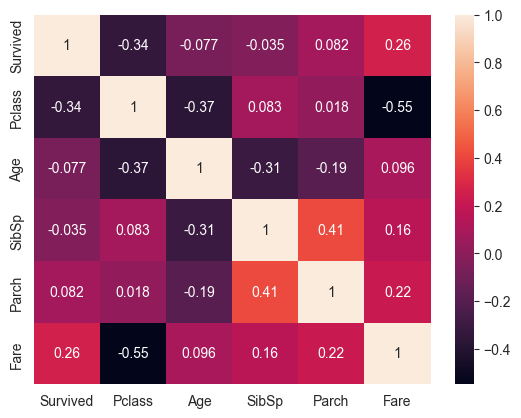

In [501]:
sns.heatmap(data.corr(numeric_only=True), annot=True)

Посмотрим на распределение признаков

array([[<Axes: title={'center': 'Survived'}>,
        <Axes: title={'center': 'Pclass'}>],
       [<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'SibSp'}>],
       [<Axes: title={'center': 'Parch'}>,
        <Axes: title={'center': 'Fare'}>]], dtype=object)

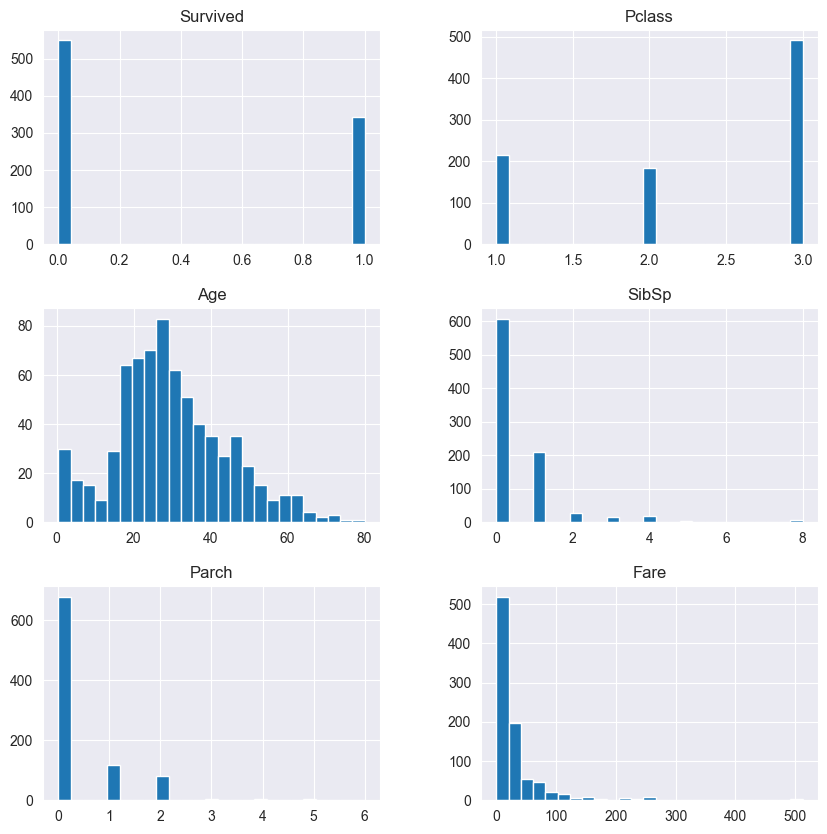

In [502]:
fig, ax = plt.subplots(figsize=(10,10))
data.hist(ax=ax, bins=25)

### Обработка пустых значений

In [503]:
for column in data.isna().columns.values.tolist():
    print(data.isna()[column].value_counts().rename({False: 'Не пропущено', True: 'Пропущено'}))
    print(" ")

Survived
Не пропущено    891
Name: count, dtype: int64
 
Pclass
Не пропущено    891
Name: count, dtype: int64
 
Sex
Не пропущено    891
Name: count, dtype: int64
 
Age
Не пропущено    714
Пропущено       177
Name: count, dtype: int64
 
SibSp
Не пропущено    891
Name: count, dtype: int64
 
Parch
Не пропущено    891
Name: count, dtype: int64
 
Ticket
Не пропущено    891
Name: count, dtype: int64
 
Fare
Не пропущено    891
Name: count, dtype: int64
 
Embarked
Не пропущено    889
Пропущено         2
Name: count, dtype: int64
 


Проверим признак Age, связан ли признак с определенным случаем

array([[<Axes: title={'center': 'Survived'}>,
        <Axes: title={'center': 'Pclass'}>],
       [<Axes: title={'center': 'SibSp'}>,
        <Axes: title={'center': 'Parch'}>],
       [<Axes: title={'center': 'Fare'}>, <Axes: >]], dtype=object)

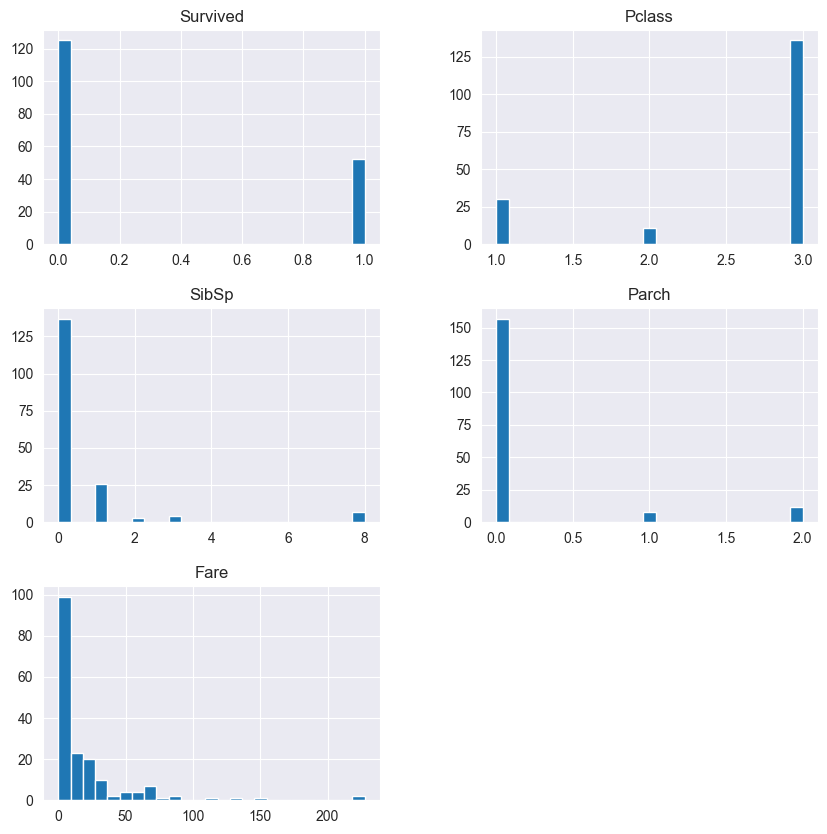

In [504]:
fig, ax = plt.subplots(figsize=(10,10))
data[data['Age'].isna()].drop(columns='Age').hist(ax=ax, bins=25)

Пропущенные значения у признака Age никак не связаны, поэтому заполним их средним

In [505]:
data['Age'].fillna(data['Age'].mean(), inplace=True)

У признака Embarked всего лишь 2 пропущенных значений, поэтому можем просто удалить объекты

In [506]:
data = data.dropna(subset=['Embarked'])

Пропущенные значения были устранены

In [507]:
print(data.isna().sum())

Survived    0
Pclass      0
Sex         0
Age         0
SibSp       0
Parch       0
Ticket      0
Fare        0
Embarked    0
dtype: int64


### Определим выбросы

In [508]:
data.describe()

,Survived,Pclass,Age,SibSp,Parch,Fare
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.382452,2.311586,29.653446,0.524184,0.382452,32.096681
std,0.486260,0.834700,12.968366,1.103705,0.806761,49.697504
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,22.000000,0.000000,0.000000,7.895800
50%,0.000000,3.000000,29.699118,0.000000,0.000000,14.454200
75%,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


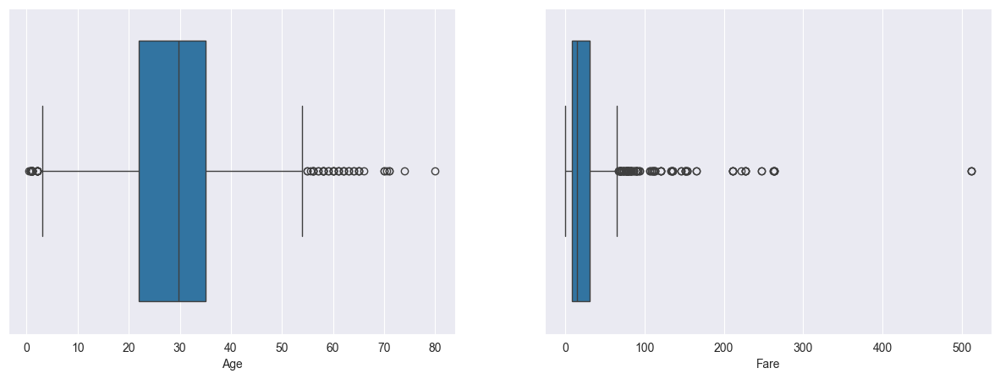

In [509]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Построение boxplot'ов для каждого столбца
for i, column in enumerate(data[['Age','Fare']].select_dtypes('number').columns):
    sns.boxplot(x=data[column], ax=axes[i], orient='h')

Уберем шумные объекты, значение признака Fare которых больше 300

In [510]:
data = data[data['Fare'] < 300]
data.shape[0]

886

### Разделение данных на объекты-признаки и целевую переменную

In [511]:
features = data.drop(columns='Survived')
target = data['Survived']

### Определим и разделим признаки на категориальные и численные

In [512]:
num_columns = ['Age', 'Fare']
cat_columns = [column for column in features.columns if column not in num_columns]
num_columns, cat_columns

(['Age', 'Fare'], ['Pclass', 'Sex', 'SibSp', 'Parch', 'Ticket', 'Embarked'])

In [513]:
features[cat_columns].nunique()

Pclass        3
Sex           2
SibSp         7
Parch         7
Ticket      679
Embarked      3
dtype: int64

Удалим признак Ticket, который имеет много уникальных категорий

In [514]:
features.drop(columns='Ticket', inplace=True)
cat_columns = cat_columns.remove('Ticket')
features

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,3,male,22.000000,1,0,7.2500,S
1,1,female,38.000000,1,0,71.2833,C
2,3,female,26.000000,0,0,7.9250,S
3,1,female,35.000000,1,0,53.1000,S
4,3,male,35.000000,0,0,8.0500,S
...,...,...,...,...,...,...,...
886,2,male,27.000000,0,0,13.0000,S
887,1,female,19.000000,0,0,30.0000,S
888,3,female,29.699118,1,2,23.4500,S
889,1,male,26.000000,0,0,30.0000,C


### Закодируем наши категориальные признаки с помощью OneHotEncoder

In [515]:
features = pd.get_dummies(features)
features

,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,3,22.000000,1,0,7.2500,False,True,False,False,True
1,1,38.000000,1,0,71.2833,True,False,True,False,False
2,3,26.000000,0,0,7.9250,True,False,False,False,True
3,1,35.000000,1,0,53.1000,True,False,False,False,True
4,3,35.000000,0,0,8.0500,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...
886,2,27.000000,0,0,13.0000,False,True,False,False,True
887,1,19.000000,0,0,30.0000,True,False,False,False,True
888,3,29.699118,1,2,23.4500,True,False,False,False,True
889,1,26.000000,0,0,30.0000,False,True,True,False,False


### Нормализуем данные

In [516]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
features = pd.DataFrame(ss.fit_transform(features), columns=features.columns)
features

,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0.821948,-0.588209,0.429180,-0.474007,-0.564532,-0.735438,0.735438,-0.478381,-0.308511,0.613006
1,-1.581503,0.644576,0.429180,-0.474007,0.992225,1.359733,-1.359733,2.090382,-0.308511,-1.631305
2,0.821948,-0.280013,-0.476185,-0.474007,-0.548122,1.359733,-1.359733,-0.478381,-0.308511,0.613006
3,-1.581503,0.413429,0.429180,-0.474007,0.550159,1.359733,-1.359733,-0.478381,-0.308511,0.613006
4,0.821948,0.413429,-0.476185,-0.474007,-0.545083,-0.735438,0.735438,-0.478381,-0.308511,0.613006
...,...,...,...,...,...,...,...,...,...,...
881,-0.379778,-0.202964,-0.476185,-0.474007,-0.424740,-0.735438,0.735438,-0.478381,-0.308511,0.613006
882,-1.581503,-0.819356,-0.476185,-0.474007,-0.011441,1.359733,-1.359733,-0.478381,-0.308511,0.613006
883,0.821948,0.005001,0.429180,2.003694,-0.170683,1.359733,-1.359733,-0.478381,-0.308511,0.613006
884,-1.581503,-0.280013,-0.476185,-0.474007,-0.011441,-0.735438,0.735438,2.090382,-0.308511,-1.631305


## Построение классических моделей

In [517]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split

log_reg = LogisticRegression()
tree = DecisionTreeClassifier()
forest = RandomForestClassifier()

### Используем GridSearchCV для подбора наилучших гиперпараметров и кросс-валидации

In [518]:
log_reg_param = {'penalty': ['l1', 'l2', 'elasticnet'],
           'C': np.linspace(0.01, 3, 100),
           'solver': ['lbfgs', 'liblinear', 'saga']}
tree_param = {'criterion' : ['gini', 'entropy', 'log_loss'],
             'max_depth' : np.arange(3, 20),
             'min_samples_split' : np.arange(2, 10),
             'min_samples_leaf' : np.arange(1, 20)}
forest_param = {'n_estimators': np.arange(300, 700, 40),
             'criterion' : ['entropy', 'gini'],
             'max_depth' : np.arange(3, 20)}

### Разделим матрицу признаков-объектов на тренировочную и валидационную выборки

In [519]:
features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.15)
features_train.shape, features_test.shape, target_train.shape, target_test.shape

((753, 10), (133, 10), (753,), (133,))

### Найдем наилучшие гиперпараметры для моделей

In [520]:
import warnings
warnings.filterwarnings('ignore')

In [521]:
log_reg_grid = GridSearchCV(log_reg, param_grid=log_reg_param)
log_reg_grid = log_reg_grid.fit(features_train, target_train)
log_reg = log_reg_grid.best_estimator_
log_reg_grid.best_params_

{'C': 0.16101010101010105, 'penalty': 'l1', 'solver': 'saga'}

In [522]:
tree_grid = GridSearchCV(tree, tree_param, verbose=100)
tree_grid = tree_grid.fit(features_train, target_train)
tree = tree_grid.best_estimator_
tree_grid.best_params_

Fitting 5 folds for each of 7752 candidates, totalling 38760 fits
[CV 1/5; 1/7752] START criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2
[CV 1/5; 1/7752] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.808 total time=   0.0s
[CV 2/5; 1/7752] START criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2
[CV 2/5; 1/7752] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.788 total time=   0.0s
[CV 3/5; 1/7752] START criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2
[CV 3/5; 1/7752] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.841 total time=   0.0s
[CV 4/5; 1/7752] START criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2
[CV 4/5; 1/7752] END criterion=gini, max_depth=3, min_samples_leaf=1, min_samples_split=2;, score=0.820 total time=   0.0s
[CV 5/5; 1/7752] START criterion=gini, max_depth=3, min_samples_leaf=1, mi

{'criterion': 'gini',
 'max_depth': 17,
 'min_samples_leaf': 5,
 'min_samples_split': 8}

In [523]:
forest_grid = GridSearchCV(forest, forest_param, verbose=50)
forest_grid = forest_grid.fit(features_train, target_train)
forest = forest_grid.best_estimator_
forest_grid.best_params_

Fitting 5 folds for each of 340 candidates, totalling 1700 fits
[CV 1/5; 1/340] START criterion=entropy, max_depth=3, n_estimators=300..........
[CV 1/5; 1/340] END criterion=entropy, max_depth=3, n_estimators=300;, score=0.815 total time=   0.2s
[CV 2/5; 1/340] START criterion=entropy, max_depth=3, n_estimators=300..........
[CV 2/5; 1/340] END criterion=entropy, max_depth=3, n_estimators=300;, score=0.775 total time=   0.2s
[CV 3/5; 1/340] START criterion=entropy, max_depth=3, n_estimators=300..........
[CV 3/5; 1/340] END criterion=entropy, max_depth=3, n_estimators=300;, score=0.821 total time=   0.2s
[CV 4/5; 1/340] START criterion=entropy, max_depth=3, n_estimators=300..........
[CV 4/5; 1/340] END criterion=entropy, max_depth=3, n_estimators=300;, score=0.780 total time=   0.2s
[CV 5/5; 1/340] START criterion=entropy, max_depth=3, n_estimators=300..........
[CV 5/5; 1/340] END criterion=entropy, max_depth=3, n_estimators=300;, score=0.827 total time=   0.2s
[CV 1/5; 2/340] START

{'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 340}

In [524]:
log_reg.fit(features_train, target_train)
target_pred_train_lr = log_reg.predict(features_train)
target_pred_test_lr = log_reg.predict(features_test)

In [525]:
tree.fit(features_train, target_train)
target_pred_train_tree = tree.predict(features_train)
target_pred_test_tree = tree.predict(features_test)

In [529]:
forest.fit(features_train, target_train)
target_pred_train_forest = forest.predict(features_train)
target_pred_test_forest = forest.predict(features_test)

После обучения моделей, найдем их качество. В качестве метрики будем использовать **accuracy**

In [530]:
from sklearn.metrics import accuracy_score

In [531]:
accuracy_score(target_pred_train_lr, target_train), accuracy_score(target_pred_test_lr, target_test)

(0.7941567065073041, 0.7969924812030075)

In [532]:
accuracy_score(target_pred_train_tree, target_train), accuracy_score(target_pred_test_tree, target_test)

(0.8950863213811421, 0.8045112781954887)

In [533]:
accuracy_score(target_pred_train_forest, target_train), accuracy_score(target_pred_test_forest, target_test)

(0.9163346613545816, 0.8270676691729323)

## Загрузка и обработка тестовых данных

In [560]:
data_test = pd.read_csv('test.csv', index_col='PassengerId')
data_test.head(10)
data_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 418 entries, 892 to 1309
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Pclass    418 non-null    int64  
 1   Name      418 non-null    object 
 2   Sex       418 non-null    object 
 3   Age       332 non-null    float64
 4   SibSp     418 non-null    int64  
 5   Parch     418 non-null    int64  
 6   Ticket    418 non-null    object 
 7   Fare      417 non-null    float64
 8   Cabin     91 non-null     object 
 9   Embarked  418 non-null    object 
dtypes: float64(2), int64(3), object(5)
memory usage: 35.9+ KB


In [561]:
data_test = data_test.drop(columns=['Name', 'Ticket', 'Cabin'])
data_test.head()

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
PassengerId,,,,,,,
892,3,male,34.5,0,0,7.8292,Q
893,3,female,47.0,1,0,7.0000,S
894,2,male,62.0,0,0,9.6875,Q
895,3,male,27.0,0,0,8.6625,S
896,3,female,22.0,1,1,12.2875,S


In [562]:
data_test.isna().sum()

Pclass       0
Sex          0
Age         86
SibSp        0
Parch        0
Fare         1
Embarked     0
dtype: int64

In [563]:
data_test['Age'].fillna(data_test['Age'].mean(), inplace=True)
data_test['Fare'].fillna(data_test['Fare'].mean(), inplace=True)

In [564]:
data_test.isna().sum()

Pclass      0
Sex         0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64

In [565]:
data_test = pd.get_dummies(data_test, columns=['Sex', 'Embarked'])
data_test.head()

,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
PassengerId,,,,,,,,,,
892,3,34.5,0,0,7.8292,False,True,False,True,False
893,3,47.0,1,0,7.0000,True,False,False,False,True
894,2,62.0,0,0,9.6875,False,True,False,True,False
895,3,27.0,0,0,8.6625,False,True,False,False,True
896,3,22.0,1,1,12.2875,True,False,False,False,True


In [566]:
data_test = pd.DataFrame(ss.fit_transform(data_test), columns=data_test.columns, index=data_test.index)
data_test

,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
PassengerId,,,,,,,,,,
892,0.873482,0.334993,-0.499470,-0.400248,-0.498407,-0.755929,0.755929,-0.568142,2.843757,-1.350676
893,0.873482,1.325530,0.616992,-0.400248,-0.513274,1.322876,-1.322876,-0.568142,-0.351647,0.740370
894,-0.315819,2.514175,-0.499470,-0.400248,-0.465088,-0.755929,0.755929,-0.568142,2.843757,-1.350676
895,0.873482,-0.259330,-0.499470,-0.400248,-0.483466,-0.755929,0.755929,-0.568142,-0.351647,0.740370
896,0.873482,-0.655545,0.616992,0.619896,-0.418471,1.322876,-1.322876,-0.568142,-0.351647,0.740370
...,...,...,...,...,...,...,...,...,...,...
1305,0.873482,0.000000,-0.499470,-0.400248,-0.494448,-0.755929,0.755929,-0.568142,-0.351647,0.740370
1306,-1.505120,0.691586,-0.499470,-0.400248,1.313753,1.322876,-1.322876,1.760125,-0.351647,-1.350676
1307,0.873482,0.651965,-0.499470,-0.400248,-0.508792,-0.755929,0.755929,-0.568142,-0.351647,0.740370


In [567]:
target_pred_test_forest_test = forest.predict(data_test)
data_ans = pd.DataFrame(target_pred_test_forest_test, index=data_test.index, columns=['Survived'])
data_ans.index.name = 'PassengerId'
data_ans.to_csv('pred_forest.csv')

## Обучение с помощью STACKING

In [571]:
from sklearn.ensemble import StackingClassifier

estimators = [
    ('lr', log_reg),
    ('tree', tree),
    ('forest', forest)
]
sc = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())

In [572]:
sc.fit(features_train, target_train)
target_pred_train_sc = sc.predict(features_train)
target_pred_test_sc = sc.predict(features_test)

In [573]:
accuracy_score(target_train, target_pred_train_sc), accuracy_score(target_test, target_pred_test_sc)

(0.9030544488711819, 0.8345864661654135)

In [574]:
target_pred_test_sc_test = sc.predict(data_test)
ans_df = pd.DataFrame(target_pred_test_sc_test, index=data_test.index, columns=['Survived'])
ans_df.index.name = 'PassengerId'
ans_df.to_csv('pred_sc.csv')

## Обучение с помощью BAGGING

In [575]:
from sklearn.ensemble import BaggingClassifier
bc = BaggingClassifier(sc, n_estimators=100, n_jobs=-1)

In [577]:
bc.fit(features_train, target_train)
target_pred_train_bc = bc.predict(features_train)
target_pred_test_bc = bc.predict(features_test)

/Users/leaflaur/Documents/Обучение ML/KaggleCompetitions/venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/leaflaur/Documents/Обучение ML/KaggleCompetitions/venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/leaflaur/Documents/Обучение ML/KaggleCompetitions/venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [578]:
accuracy_score(target_train, target_pred_train_bc), accuracy_score(target_test, target_pred_test_bc)

(0.8884462151394422, 0.8345864661654135)

In [579]:
target_pred_test_bc_test = bc.predict(data_test)
ans_df = pd.DataFrame(target_pred_test_bc_test, index=data_test.index, columns=['Survived'])
ans_df.index.name = 'PassengerId'
ans_df.to_csv('pred_bc.csv')

## Обучение с помощью CATBOOST

In [635]:
from catboost import CatBoostClassifier

cbc = CatBoostClassifier(iterations=6500,
                         depth=11,
                         loss_function='Logloss',
                         verbose=True)

In [636]:
cbc.fit(features_train, target_train, verbose=100)
target_pred_train_cbc = cbc.predict(features_train)
target_pred_test_cbc = cbc.predict(features_test)

Learning rate set to 0.00164
0:	learn: 0.6921927	total: 1.97ms	remaining: 12.8s
100:	learn: 0.5941431	total: 200ms	remaining: 12.7s
200:	learn: 0.5258351	total: 423ms	remaining: 13.3s
300:	learn: 0.4758784	total: 658ms	remaining: 13.6s
400:	learn: 0.4410614	total: 902ms	remaining: 13.7s
500:	learn: 0.4138456	total: 1.18s	remaining: 14.1s
600:	learn: 0.3936834	total: 1.41s	remaining: 13.9s
700:	learn: 0.3770889	total: 1.68s	remaining: 13.9s
800:	learn: 0.3635930	total: 1.99s	remaining: 14.1s
900:	learn: 0.3518262	total: 2.3s	remaining: 14.3s
1000:	learn: 0.3415767	total: 2.61s	remaining: 14.4s
1100:	learn: 0.3331426	total: 2.91s	remaining: 14.3s
1200:	learn: 0.3261868	total: 3.19s	remaining: 14.1s
1300:	learn: 0.3193250	total: 3.5s	remaining: 14s
1400:	learn: 0.3130229	total: 3.86s	remaining: 14s
1500:	learn: 0.3072471	total: 4.22s	remaining: 14.1s
1600:	learn: 0.3019095	total: 4.55s	remaining: 13.9s
1700:	learn: 0.2966909	total: 4.89s	remaining: 13.8s
1800:	learn: 0.2918056	total: 5.23

In [637]:
accuracy_score(target_train, target_pred_train_cbc), accuracy_score(target_test, target_pred_test_cbc)

(0.9561752988047809, 0.849624060150376)

In [638]:
y_pred_test_cbc_test = cbc.predict(data_test)
ans_df = pd.DataFrame(y_pred_test_cbc_test, index=data_test.index, columns=['Survived'])
ans_df.index.name = 'PassengerId'
ans_df.to_csv('pred_cbc.csv')